In [1]:
using LightGraphs, Plots, GraphPlot, Compose, Random, StatsBase, CSV

In [2]:
include("ContactModels.jl")

buildstate (generic function with 4 methods)

In [3]:
wapop=CSV.read("all-wa.csv")
waloc=CSV.read("all-wa-pos.csv")

,City / Town,Population,long,latt
,String,String,Float64,Float64
1,Perth,"1,874,578",115.861,-31.9505
2,Bunbury,"71,090",115.64,-33.3256
3,Geraldton,"31,982",114.614,-28.7797
4,Kalgoorlie-Boulder,"29,875",121.466,-30.749
5,Albany,"29,373",117.884,-35.0269
6,Busselton,"25,329",115.346,-33.6532
7,Karratha,"15,828",116.846,-20.7353
8,Broome,"13,984",122.23,-17.9644
9,Port Hedland,"13,828",118.486,-20.9818


In [4]:
#the following parameter is hardcoded here, even though it is used within ContactModels.jl just to ensure it is not forgotten....
majorlocalities=58    #global scope intended. 
brk=majorlocalities*2
# remove empty towns (for now)
(nr,nc)=size(wapop)
townpop1=wapopint=parse.(Int, replace.(wapop[1:2:116,2], r","=> ""))
townpop2=wapopint=parse.(Int, replace.(wapop[116+1:end,2], r","=> ""))
popl=[townpop1; townpop2]
nr=nr-majorlocalities
rowidx=[]
for i in majorlocalities+1:nr
    if popl[i]!=0
        rowidx=[rowidx; i]
    end
end
rowidx1=[1:(majorlocalities*2); rowidx.+majorlocalities]
rowidx2=[1:majorlocalities; rowidx]

#########
wapop2=wapop[rowidx1,:] #remove all empty settlements.
wapop=wapop2; #we'll just keep the one without the empty towns
waloc2=waloc[rowidx2,:]
waloc=waloc2;


In [21]:
(nr,nc)=size(wapop)
nr=nr-majorlocalities
######################################
dist=Array{Int,2}(undef,nr,nr)
for i in 1:nr
    for j in 1:nr
        dist[i,j]=similaritytown(wapop,i,j,Array(waloc[:,3:4]))
    end
end

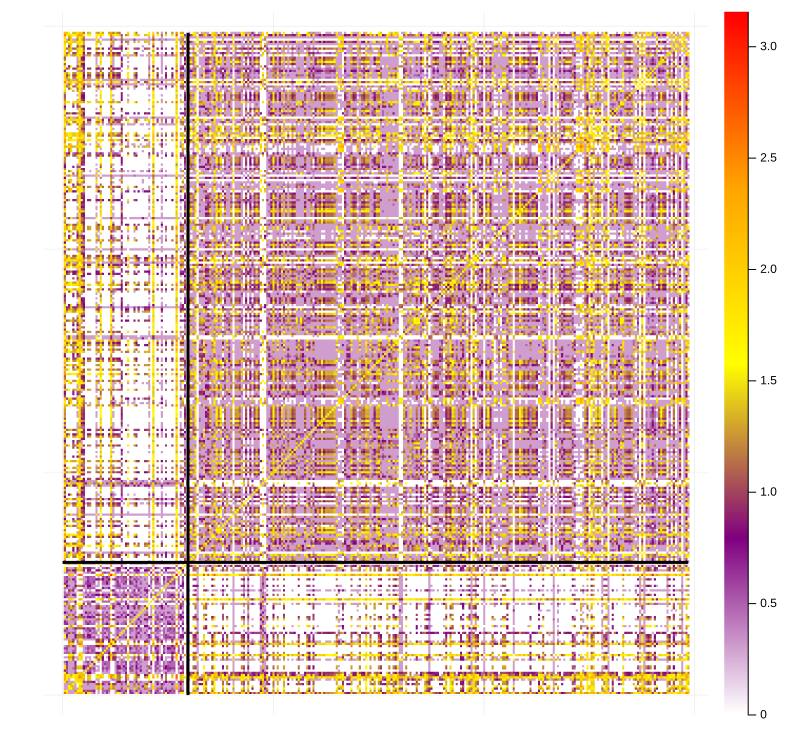

In [22]:
heatmap(log10.(dist.+1),color=cgrad([:white, :purple, :yellow, :orange, :red]),size=(800,750))
plot!([0; 297],[59.5;59.5],linewidth=3,color=:black,axis=false, legend=false)
plot!([59.5;59.5],[0; 297],linewidth=3,color=:black,axis=false, legend=false)

In [23]:
png("fig-heatmap.png")

In [24]:
# extract information from dataframe for regions and populations etc
#
#population - need to do this again to get the non-zero elements!
#brk=majorlocalities*2
townpop1=wapopint=parse.(Int, replace.(wapop[1:2:brk,2], r","=> ""))
townpop2=wapopint=parse.(Int, replace.(wapop[brk+1:end,2], r","=> ""))
popl=[townpop1; townpop2]
#townpop=townpop[1:end-1]
#region and assign colouring
nodecolor = [colorant"lightseagreen", colorant"orange", colorant"red", colorant"green", colorant"yellow", colorant"brown", colorant"pink", colorant"purple", colorant"blue", colorant"violet", colorant"black"]
townlabel=[wapop[1:2:brk,3]; wapop[brk+1:end,3]]
#townlabel=townlabel[1:end-1]
regions=unique(townlabel)
regioni=Array{Int,1}(undef,nr)
for i in 1:nr
    regioni[i]=findall(x->x==1,townlabel[i].==regions)[1]
end
nodefillc = nodecolor[regioni]
#town names
townlabel=[wapop[1:2:brk,1]; wapop[brk+1:end,1]]
#townlabel=townlabel[1:end-1]
posn=Array(waloc[:,3:4])

297×2 Array{Float64,2}:
 115.861  -31.9505
 115.64   -33.3256
 114.614  -28.7797
 121.466  -30.749
 117.884  -35.0269
 115.346  -33.6532
 116.846  -20.7353
 122.23   -17.9644
 118.486  -20.9818
 121.993  -33.4866
 115.637  -31.5471
 116.183  -33.3154
 116.703  -31.642
   ⋮      
 121.703  -18.731
 115.209  -25.062
 123.168  -17.6448
 127.542  -25.2828
 123.659  -17.737
 125.616  -26.5265
 123.121  -22.044
 128.616  -18.794
 115.61   -28.3847
 124.726  -22.3284
 124.15   -18.0392
 117.12   -20.7518

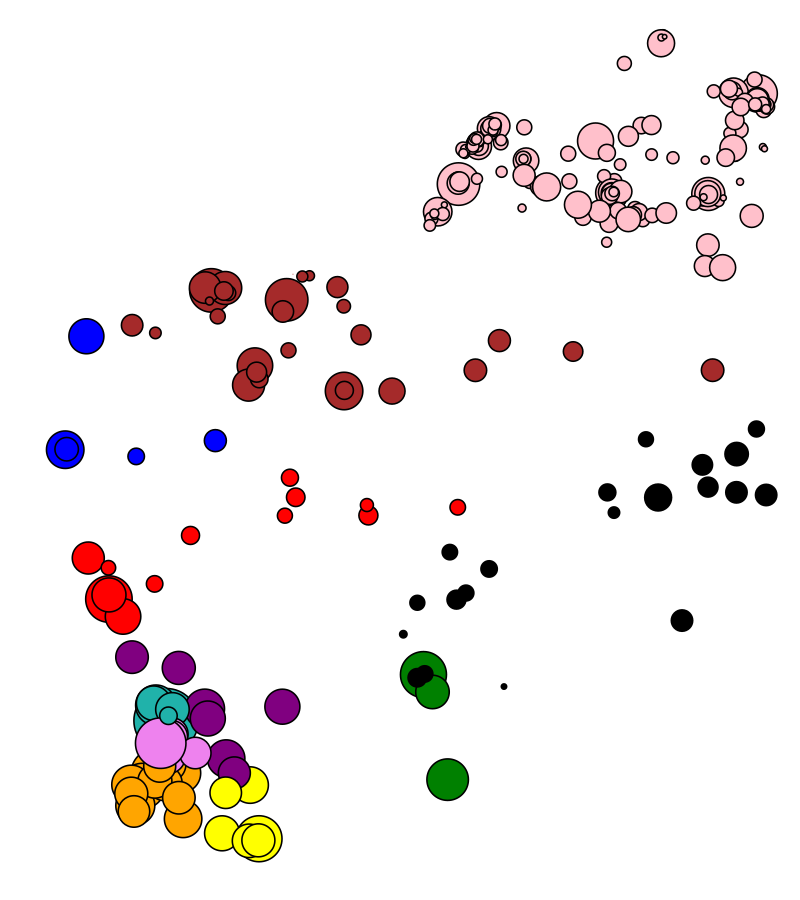

In [25]:
plot(posn[:,1],posn[:,2], seriestype = :scatter, grid = false, markercolor=nodefillc,markersize=2.5*log.(popl),legend=false,axis=false,size=(800,900))


In [26]:
png("fig-map-wa")

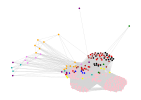

In [31]:
gplot(Graph(dist.>2),nodefillc=nodefillc)

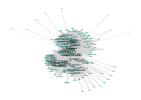

In [38]:
#just have alook at the Kimberley
ind=findall( x->(x == 7), regioni)
gplot(Graph(dist[ind,ind].>17),nodelabel=townlabel[ind],nodelabelsize=log.(popl[ind]),nodesize=10 .+ log.(popl[ind]))

In [39]:
bigtownlabel=deepcopy(townlabel)
bigtownlabel[majorlocalities+1:end].="";
#gplot(Graph(dist.>9),nodelabel=bigtownlabel,nodelabelsize=log.(popl),nodesize=10 .+ log.(popl),nodefillc=nodefillc)


In [40]:
popd=zeros(Int,(11,1))
for i in 1:length(regioni)
    popd[regioni[i]] += popl[i]
end


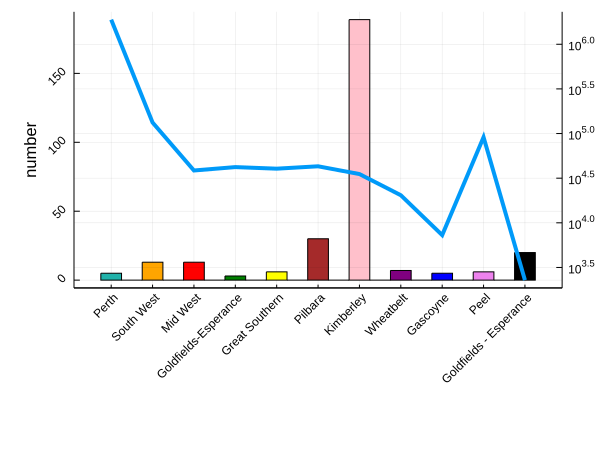

In [41]:
nodecolor2=deepcopy(nodecolor)
nodecolor2[[1:2:11; 2:2:11]]=nodecolor
histogram(regioni,rotation=45, xticks=(1.25:(length(regions)+0.25),regions),color=nodecolor2,legend=false, ylabel="number")
plt=twinx()
plot!(plt, 0.25 .+ (1:11), popd , xaxis=[], legend=false, linewidth=4, yaxis=:log, ylabel="population",size=(600,450))


In [16]:
png("figure1")


In [42]:
import Cairo, Fontconfig

In [48]:

gg=gplot(Graph(dist.>2),nodelabel=bigtownlabel,nodelabelsize=log.(popl),nodesize=10 .+ log2.(popl),nodefillc=nodefillc)
draw(PNG("figure2a.png", 32cm, 32cm), gg)

In [50]:
vecx=Vector(posn[:,1])
vecy=Vector(posn[:,2])
gg=gplot(Graph(dist),vecx,-vecy,nodesize=log.(popl), NODESIZE=0.03,  nodefillc=nodefillc,edgestrokec=colorant"black",edgelinewidth=dist[dist.>0])
draw(PNG("figure2b.png", 32cm, 32cm), gg)


In [51]:
function vulnerability(It)
    (ndays, nsims, nlocs) = size(It)
    vln=Array{Float64,2}(undef,nlocs,nsims)
    for i in 1:nlocs
        for j in 1:nsims
            idx=findall(x -> x>0, It[:,j,i])
            if isempty(idx)
                vln[i,j]=Inf
            else
                vln[i,j]=minimum(idx)
            end
        end
    end
    vln=median(vln,dims=2)
    vln=vln./vln[3] #median vulnerability comapred to Gero
    return vln
end


vulnerability (generic function with 1 method)

In [52]:
using JLD, FileIO, Statistics

In [53]:
vln=Array{Any,1}(undef,4)
for i in 1:3
    flnm="regional_output_$i.jld"
    ldd=JLD.load(flnm) # ldd=load(flnm)
    vln[i]=ldd["vuln"]
end

In [54]:
VV=sum(vln[1:3])

24×297 Array{Float64,2}:
 0.0377389  2.86178  3.0  3.17054  …  3.81234  3.66091  3.18857  3.48447
 0.0430593  2.89544  3.0  3.17224     3.83017  3.56579  3.2028   3.40575
 0.0408176  2.71432  3.0  3.22454     4.06806  3.84384  3.20418  3.52392
 0.0397432  2.70254  3.0  3.29781     3.93457  3.76149  3.15261  3.43748
 0.0425546  2.8583   3.0  3.20588     3.71614  3.6597   3.17037  3.39008
 0.0550895  2.82942  3.0  3.17892  …  3.65296  3.58492  3.06273  3.32243
 0.0463942  2.74507  3.0  3.25517     4.00577  3.74231  3.14712  3.43341
 0.0591618  2.67449  3.0  3.20083     3.7636   3.61498  3.05231  3.33309
 0.0448027  2.82848  3.0  3.16561     3.75029  3.52314  3.11202  3.33756
 0.044124   2.86049  3.0  3.18439     3.69019  3.54474  3.09571  3.32336
 0.0811996  2.73946  3.0  3.25286  …  3.8152   3.63665  3.08199  3.32825
 0.0478751  2.71301  3.0  3.20763     3.67051  3.54275  3.00026  3.28725
 0.0573295  2.86611  3.0  3.19158     3.60269  3.43977  3.06713  3.33436
 0.0548942  2.83598  3.0  

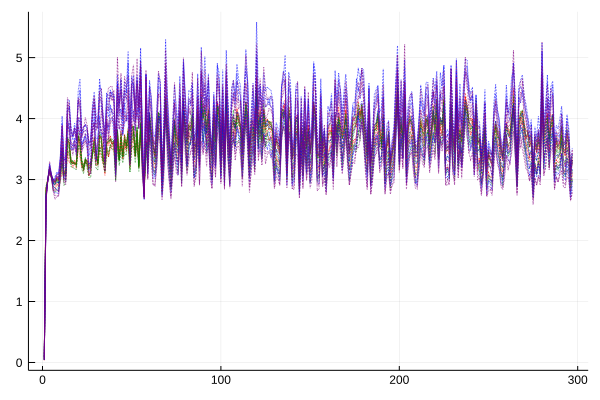

In [55]:
plot(VV[1:4:end,:]',legend=false,color=:red,style=:dot)
plot!(VV[2:4:end,:]',legend=false,color=:green,style=:dot)
plot!(VV[3:4:end,:]',legend=false,color=:blue,style=:dot)
plot!(VV[4:4:end,:]',legend=false,color=:purple,style=:dot)

In [56]:
vln=median(VV,dims=1)

1×297 Array{Float64,2}:
 0.057148  2.74463  3.0  3.1738  …  3.62782  3.48145  3.02628  3.30484

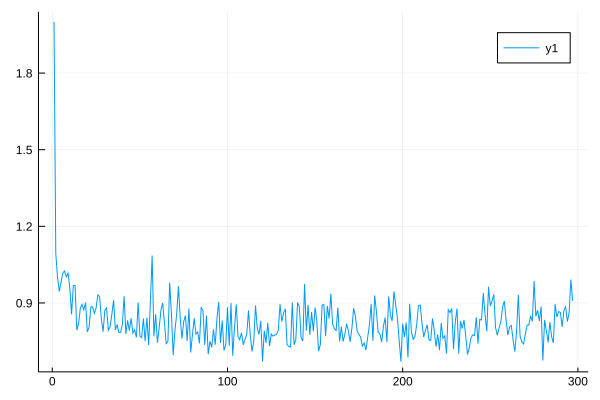

In [57]:
vln=median(VV,dims=1)
vln=1 ./ vln
vln=vln ./ vln[3]
vln[1]=2#Inf
plot(vln')

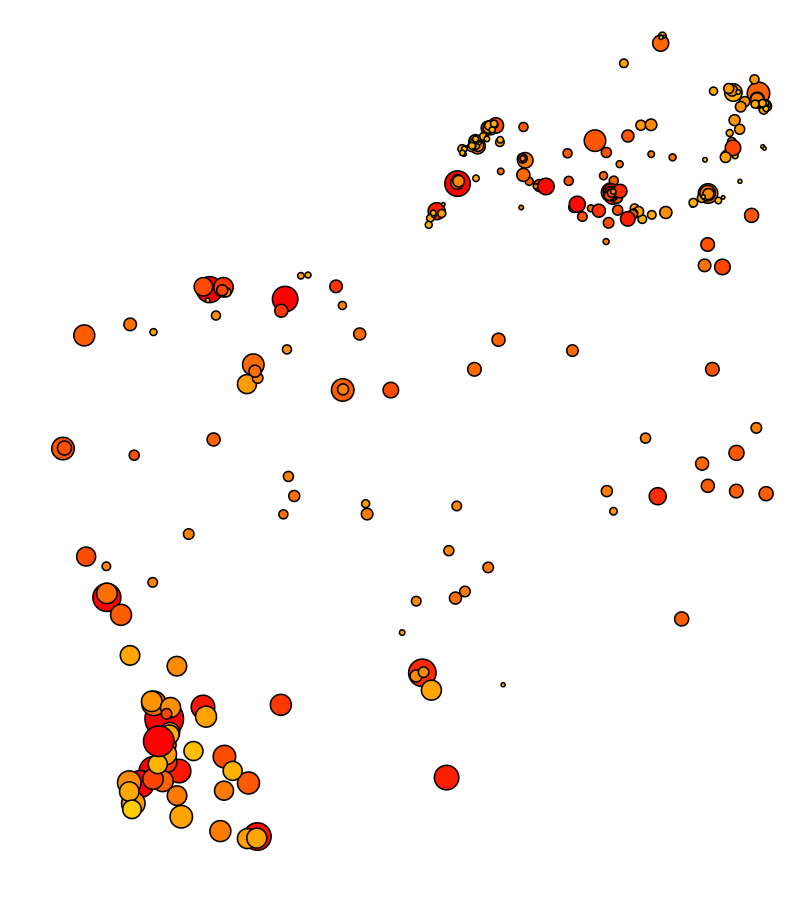

In [62]:
#gr()
clrmp=cgrad([:green, :blue, :yellow, :red])
nodefillc=clrmp[vln][1:end]
plot(posn[:,1],posn[:,2], seriestype = :scatter, grid=false, markercolor=nodefillc,markersize=1.5*log.(popl),legend=false,axis=false,size=(800,900),hover=townlabel)
#plot(posn[:,1],posn[:,2], seriestype = :scatter, grid=false, markercolor=nodefillc,markersize=1.5*log.(popl),legend=false,axis=false,size=(800,900))#,hover=townlabel)


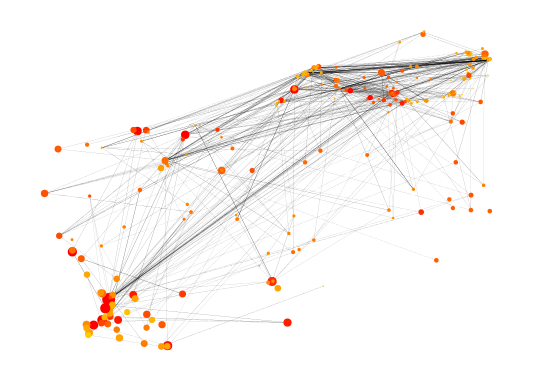

In [65]:
vecx=Vector(1.5*posn[:,1])
vecy=Vector(posn[:,2])
gg=gplot(Graph(dist),vecx,-vecy,nodesize=log.(popl), NODESIZE=0.03,  nodefillc=nodefillc,edgestrokec=colorant"black",edgelinewidth=dist[dist.>0])
#draw(PNG("fig-vuln-conn.png", 32cm, 32cm), gg)


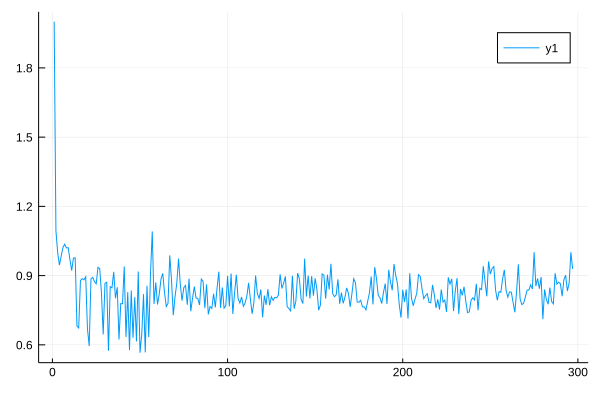

In [29]:
plot(vln')

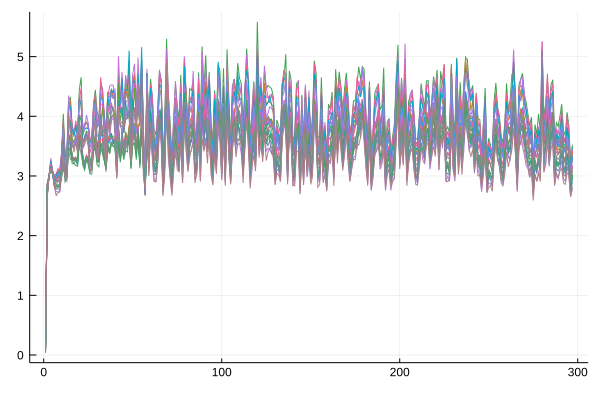

In [66]:
plot(VV',legend=false)
#plot!(mean(vln,dims=1)',linewidth=3,legend=false)

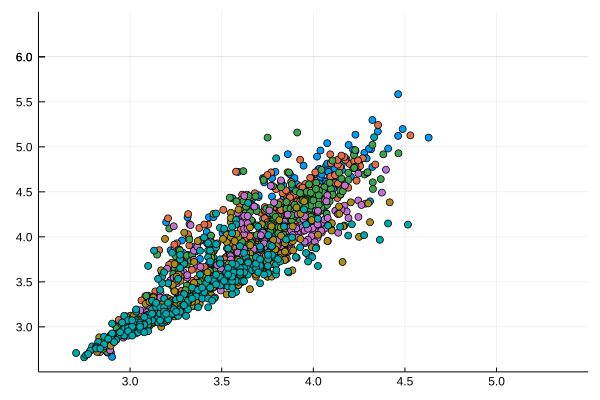

In [70]:
plot(VV[2:4:end,:]',VV[3:4:end,:]',legend=false, seriestype=:scatter, ylimit=(2.5,6.5), xlimit=(2.5,5.5))

In [96]:
col1=VV[1:4:end,:]
col2=VV[2:4:end,:]
col3=VV[3:4:end,:]
col4=VV[4:4:end,:]
col1=col1[:]
col2=col2[:]
col3=col3[:]
col4=col4[:]

1782-element Array{Float64,1}:
 0.03974316511229263
 0.05916182000338291
 0.04787506400409626
 0.056966618287373004
 0.08792270531400967
 0.09413067552602436
 2.7025352276358987
 2.6744863838036874
 2.713005632360471
 2.677431059506531
 2.713526570048309
 2.672203765227021
 3.0
 ⋮
 3.1526075713995176
 3.0523081827289644
 3.0002560163850487
 2.810232220609579
 2.6582125603864735
 2.6483942414174972
 3.437482204596299
 3.33308937377207
 3.2872503840245777
 3.0195936139332367
 2.823671497584541
 2.7895902547065337

In [97]:
col3[isinf.(col3)].=2

1-element view(::Array{Float64,1}, [1677]) with eltype Float64:
 2.0

In [72]:
using StatsPlots

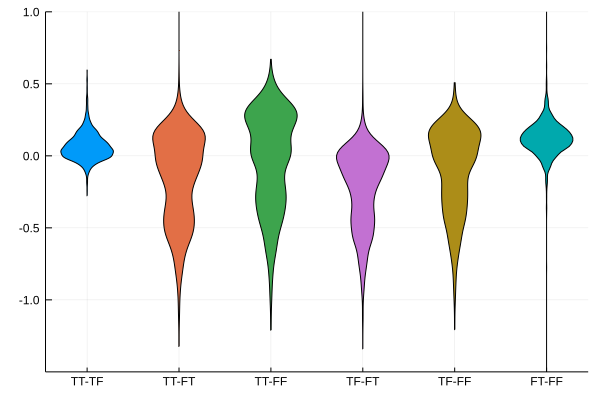

In [101]:
violin(["TT-TF" "TT-FT" "TT-FF" "TF-FT" "TF-FF" "FT-FF"],[col1-col2 col1-col3 col1-col4 col2-col3 col2-col4 col3-col4],leg=false,ylimits=(-1.5,1))

In [102]:
bc1=[col1; col2]-[col3; col4;]
bc2=[col1; col3]-[col2; col4;]

3564-element Array{Float64,1}:
 -0.005320465978898986
 -0.0125348669675246
  0.0006787330316742057
  0.002435283095660455
  0.035637013053756814
 -0.01819540419135969
 -0.03365468155743123
  0.028883951526762708
 -0.03200682109812947
  0.030131468810713713
 -0.007364580121286934
 -0.07234146035966038
  0.0
  ⋮
  0.051573545697451095
  0.09480720188641989
  0.08173721806720202
  0.11055209311591119
  0.09760139310189864
  0.049631310266590845
  0.08643561873444039
  0.10032408776639157
  0.040995777828141566
  0.16378873900794
  0.15307268846197042
  0.11342948977662548

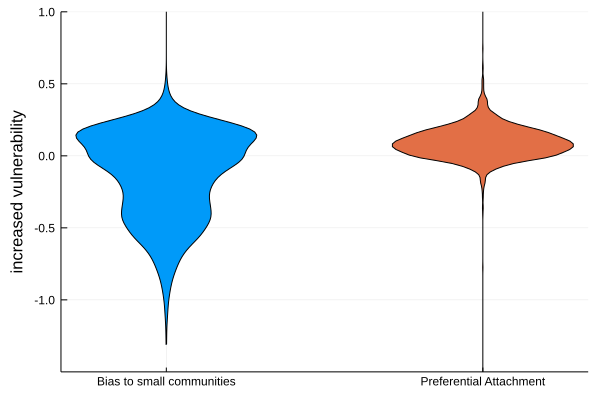

In [104]:
violin(["Bias to small communities" "Preferential Attachment"],[bc1 bc2],leg=false,ylabel="increased vulnerability",ylimit=(-1.5,1))

In [105]:
png("fig-violin.png")

In [37]:
using DataFrames

df=DataFrame(Town = townlabel,
    XPos= vecx,
    YPos = vecy,
    Popl = popl,
    Vulnerability = vln)

DimensionMismatch: DimensionMismatch("columns must be 1-dimensional")

In [38]:
CSV.write("CommunityVulnerability2.csv",df)

UndefVarError: UndefVarError: df not defined

In [39]:
pwd()

"/Users/michael/work/GitHub/epinets"

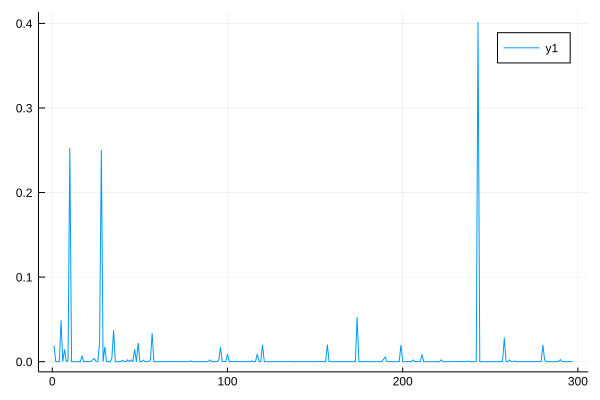

In [47]:
plot(betweenness_centrality(SimpleWeightedGraph(dist)))

In [106]:
using SimpleWeightedGraphs

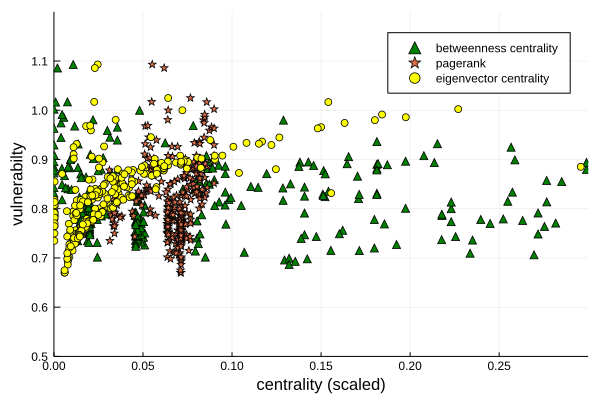

In [107]:
plot(50*betweenness_centrality(SimpleWeightedGraph(dist)),vln',color=:green,seriestype=:scatter,label="betweenness centrality",marker=:utriangle)
plot!(20*pagerank(SimpleWeightedGraph(dist)),vln',seriestype=:scatter,label="pagerank",marker=:star)
plot!(eigenvector_centrality(SimpleWeightedGraph(dist)),vln',seriestype=:scatter,label="eigenvector centrality",color=:yellow)
plot!(xlabel="centrality (scaled)", ylabel="vulnerabilty",xlimit=(0,0.3),ylimit=(0.5, 1.2))

In [108]:
png("fig-centrality.png")

In [109]:
distmx=1 ./ dist

dd=dijkstra_shortest_paths(Graph(dist.>1), 1, distmx);


In [111]:
using ColorSchemes

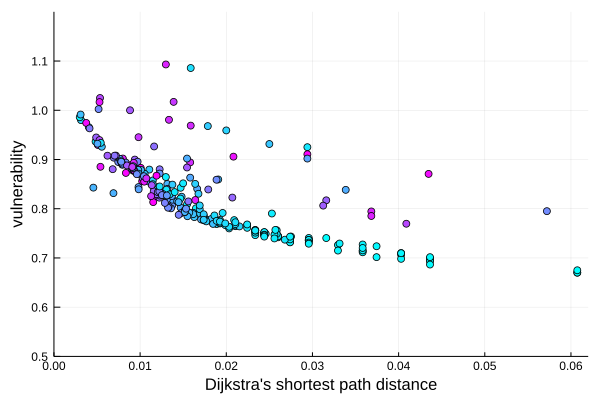

In [115]:
clrmp=cgrad(ColorSchemes.cool.colors)
nodefillc=clrmp[(popl)][1:end]
plot(dd.dists, vln',seriestype=:scatter,legend=:false,xlabel="Dijkstra's shortest path distance",color=nodefillc,ylabel="vulnerability",xlimit=(0,0.062),ylimit=(0.5,1.2))



In [116]:
png("fig-distance.png")

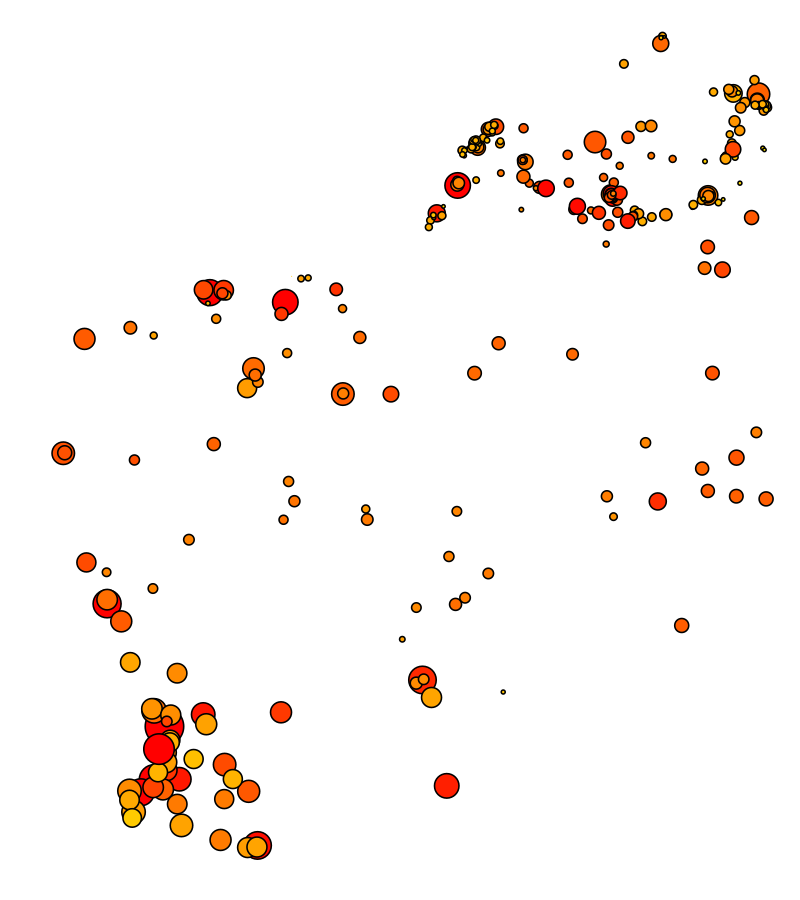

In [117]:
clrmp=cgrad([:green, :blue, :yellow, :red])
nodefillc=clrmp[vln][1:end]
plot(posn[:,1],posn[:,2], seriestype = :scatter, grid=false, markercolor=nodefillc,markersize=1.5*log.(popl),legend=false,axis=false,size=(800,900),hover=townlabel)


In [118]:
vlns=Array{Float64,2}(undef,4,297)
for i in 1:4
    vlni=median(VV[i:4:end,:],dims=1)
    vlni=1 ./ vlni
    vlni=vlni ./ vlni[3]
    vlni[1]=2#Inf
    vlns[i,:]=vlni
end
    

In [119]:
clrmp=cgrad([:green, :blue, :yellow, :red])
plt=Array{Any,1}(undef,4)
titles=["(a) Small and PA" "(b) Small not PA" "(c) Not Small and PA" "(d) Neither Small nor PA"]
for i in 1:4
    nodefillc=clrmp[vlns[i,:]][1:end]
    plt[i]=plot(posn[:,1],posn[:,2], seriestype = :scatter, title=titles[i], grid=false, markercolor=nodefillc,markersize=1.5*log.(popl),legend=false,axis=false,size=(800,900),hover=townlabel)
end
    


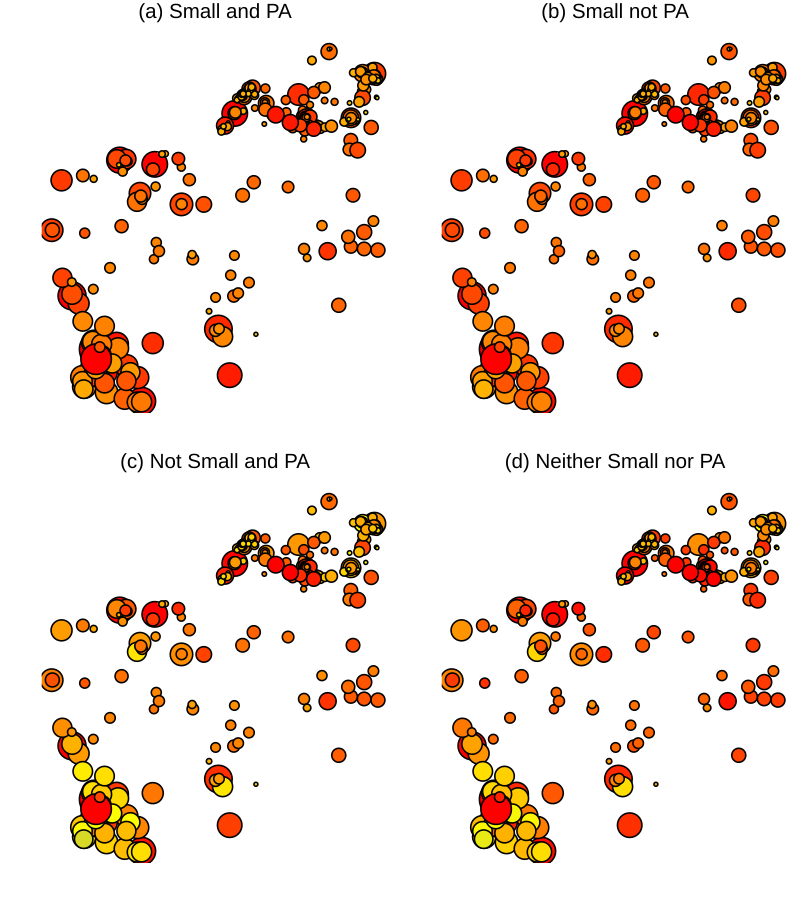

In [120]:
plot(plt[1],plt[2],plt[3],plt[4])

In [121]:
png("fig-pepsi.png")